In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from skimage.draw import polygon as draw_polygon, polygon_perimeter as draw_perimeter
from skimage.morphology import disk as morph_disk, binary_dilation
from scipy.ndimage import gaussian_filter
import albumentations as A

def create_advanced_dataset(num_images, img_size=(1024, 1024), output_dir="synthetic_data"):
    img_path = os.path.join(output_dir, "images")
    mask_path = os.path.join(output_dir, "masks")
    os.makedirs(img_path, exist_ok=True)
    os.makedirs(mask_path, exist_ok=True)
    print(f"Generowanie {num_images} obrazów do folderu {output_dir}...")
    for i in tqdm(range(num_images)):
        base_noise = np.zeros(img_size)
        for sigma in [8, 16, 32, 64]:
            base_noise += gaussian_filter(np.random.rand(*img_size), sigma=sigma)
        image = (base_noise - np.min(base_noise)) / (np.max(base_noise) - np.min(base_noise)) * 0.4
        mask_wall = np.zeros(img_size, dtype=bool)
        num_cells, placed_cells = np.random.randint(50, 80), []
        for _ in range(num_cells):
            for attempt in range(100):
                radius = np.random.randint(30, 80)
                center_x, center_y = np.random.randint(radius, img_size[1] - radius), np.random.randint(radius, img_size[0] - radius)
                is_overlapping = any(np.sqrt((center_x - px)**2 + (center_y - py)**2) < (radius + pr + 5) for px, py, pr in placed_cells)
                if not is_overlapping:
                    placed_cells.append((center_x, center_y, radius))
                    break
            if 'is_overlapping' in locals() and is_overlapping: continue
            angles = np.linspace(0, 2 * np.pi, 100, endpoint=False)
            smooth_noise_rad = gaussian_filter(np.random.randn(100), sigma=3, mode='wrap')
            deformed_radius = radius * (1 + np.random.uniform(0.15, 0.3) * smooth_noise_rad)
            rr, cc = center_y + deformed_radius * np.sin(angles), center_x + deformed_radius * np.cos(angles)
            rr_poly, cc_poly = draw_polygon(rr, cc, shape=img_size)
            internal_texture = gaussian_filter(np.random.rand(*img_size), sigma=np.random.uniform(4, 8))
            internal_texture = (internal_texture - np.min(internal_texture)) / (np.max(internal_texture) - np.min(internal_texture))
            image[rr_poly, cc_poly] = 0.5 + internal_texture[rr_poly, cc_poly] * 0.4
            rr_peri, cc_peri = draw_perimeter(rr.astype(int), cc.astype(int), shape=img_size)
            mask_wall[rr_peri, cc_peri] = True
        mask_wall = binary_dilation(mask_wall, morph_disk(2))
        image_16bit = (np.clip(image, 0, 1) * 65535).astype(np.uint16)
        mask_16bit = (mask_wall.astype(np.uint16) * 65535)
        np.save(os.path.join(img_path, f"{i}.npy"), image_16bit)
        np.save(os.path.join(mask_path, f"{i}.npy"), mask_16bit)
    print("Zbiór danych wygenerowany.")

class CellWallDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.image_dir = os.path.join(data_dir, "images")
        self.mask_dir = os.path.join(data_dir, "masks")
        self.image_files = sorted(os.listdir(self.image_dir))
        self.transform = transform
    def __len__(self): return len(self.image_files)
    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.image_files[idx])
        image = np.load(img_path)
        mask = np.load(mask_path)
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        image = image.astype(np.float32) / 65535.0
        mask = (mask > 0).astype(np.float32)
        return torch.from_numpy(image).unsqueeze(0), torch.from_numpy(mask).unsqueeze(0)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.double_conv(x)
class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels))
    def forward(self, x): return self.maxpool_conv(x)
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, bias=True), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, bias=True), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, bias=True), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        g1, x1 = self.W_g(g), self.W_x(x)
        psi = self.relu(g1 + x1)
        return x * self.psi(psi)
class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1, x2):
        x1 = self.up(x1)
        return self.conv(torch.cat([x2, x1], dim=1))
class AttentionUNET(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(AttentionUNET, self).__init__()
        self.inc = DoubleConv(n_channels, 16)
        self.down1 = Down(16, 32); self.down2 = Down(32, 64)
        self.down3 = Down(64, 128); self.down4 = Down(128, 256)
        self.att1 = AttentionGate(F_g=128, F_l=128, F_int=64); self.up1 = Up(256, 128)
        self.att2 = AttentionGate(F_g=64, F_l=64, F_int=32); self.up2 = Up(128, 64)
        self.att3 = AttentionGate(F_g=32, F_l=32, F_int=16); self.up3 = Up(64, 32)
        self.att4 = AttentionGate(F_g=16, F_l=16, F_int=8); self.up4 = Up(32, 16)
        self.outc = nn.Conv2d(16, n_classes, kernel_size=1)
    def forward(self, x):
        x1 = self.inc(x); x2 = self.down1(x1); x3 = self.down2(x2); x4 = self.down3(x3); x5 = self.down4(x4)
        g1 = self.up1.up(x5); s1 = self.att1(g=g1, x=x4); d1 = self.up1(x5, s1)
        g2 = self.up2.up(d1); s2 = self.att2(g=g2, x=x3); d2 = self.up2(d1, s2)
        g3 = self.up3.up(d2); s3 = self.att3(g=g3, x=x2); d3 = self.up3(d2, s3)
        g4 = self.up4.up(d3); s4 = self.att4(g=g4, x=x1); d4 = self.up4(d3, s4)
        return self.outc(d4)

class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss, self).__init__()
    def forward(self, inputs, targets, smooth=1):
        inputs = torch.sigmoid(inputs)
        inputs, targets = inputs.view(-1), targets.view(-1)
        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)
        BCE = nn.BCELoss(reduction='mean')(inputs, targets)
        return BCE + dice_loss

def train_model(model, train_loader, val_loader, num_epochs=25):
    criterion = DiceBCELoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    best_dice_score = 0.0
    print(f"Rozpoczynanie treningu na urządzeniu: {device}")

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f"Epoka {epoch+1}/{num_epochs} [Trening]")
        for images, masks in progress_bar:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            progress_bar.set_postfix(loss=f'{running_loss/len(train_loader):.5f}')
        
        val_dice_score = validate_model(model, val_loader, device)
        print(f"Epoka {epoch+1}/{num_epochs}, Strata: {running_loss/len(train_loader):.5f}, Wynik Dice (Walidacja): {val_dice_score:.4f}")

        if val_dice_score > best_dice_score:
            best_dice_score = val_dice_score
            torch.save(model.state_dict(), "best_attention_unet.pth")
            print(f"Zapisano nowy najlepszy model z wynikiem Dice: {best_dice_score:.4f}")

    print("Trening zakończony.")

def validate_model(model, loader, device):
    model.eval()
    dice_score = 0
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            intersection = (preds * y).sum()
            union = preds.sum() + y.sum()
            dice_score += (2. * intersection) / (union + 1e-8)
    return dice_score / len(loader)

if __name__ == "__main__":
    IMG_SIZE = (1024, 1024)
    BATCH_SIZE = 1
    NUM_TRAIN_IMAGES = 50
    NUM_VAL_IMAGES = 8 
    NUM_EPOCHS = 30
    

    train_dir = "data/train"
    val_dir = "data/validation"

    create_advanced_dataset(num_images=NUM_TRAIN_IMAGES, img_size=IMG_SIZE, output_dir=train_dir)
    create_advanced_dataset(num_images=NUM_VAL_IMAGES, img_size=IMG_SIZE, output_dir=val_dir)
    
    train_transform = A.Compose([
        A.Rotate(limit=45, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.4),
    ])

    train_dataset = CellWallDataset(data_dir=train_dir, transform=train_transform)
    val_dataset = CellWallDataset(data_dir=val_dir, transform=None) 
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    model = AttentionUNET()
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print("-" * 50)
    print(f"Model: {model.__class__.__name__}, Parametry: {num_params:,}")
    print("-" * 50)
    train_model(model, train_loader, val_loader, num_epochs=NUM_EPOCHS)



Generowanie 50 obrazów do folderu data/train...


100%|██████████| 50/50 [02:08<00:00,  2.57s/it]


Zbiór danych wygenerowany.
Generowanie 8 obrazów do folderu data/validation...


100%|██████████| 8/8 [00:22<00:00,  2.75s/it]


Zbiór danych wygenerowany.
--------------------------------------------------
Model: AttentionUNET, Parametry: 1,964,901
--------------------------------------------------
Rozpoczynanie treningu na urządzeniu: cuda


Epoka 1/30 [Trening]: 100%|██████████| 50/50 [00:23<00:00,  2.17it/s, loss=1.50618]


Epoka 1/30, Strata: 1.50618, Wynik Dice (Walidacja): 0.2157
Zapisano nowy najlepszy model z wynikiem Dice: 0.2157


Epoka 2/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.38935]


Epoka 2/30, Strata: 1.38935, Wynik Dice (Walidacja): 0.2250
Zapisano nowy najlepszy model z wynikiem Dice: 0.2250


Epoka 3/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.36152]


Epoka 3/30, Strata: 1.36152, Wynik Dice (Walidacja): 0.2273
Zapisano nowy najlepszy model z wynikiem Dice: 0.2273


Epoka 4/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.34199]


Epoka 4/30, Strata: 1.34199, Wynik Dice (Walidacja): 0.2573
Zapisano nowy najlepszy model z wynikiem Dice: 0.2573


Epoka 5/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.33098]


Epoka 5/30, Strata: 1.33098, Wynik Dice (Walidacja): 0.7290
Zapisano nowy najlepszy model z wynikiem Dice: 0.7290


Epoka 6/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.32352]


Epoka 6/30, Strata: 1.32352, Wynik Dice (Walidacja): 0.8013
Zapisano nowy najlepszy model z wynikiem Dice: 0.8013


Epoka 7/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.31701]


Epoka 7/30, Strata: 1.31701, Wynik Dice (Walidacja): 0.8135
Zapisano nowy najlepszy model z wynikiem Dice: 0.8135


Epoka 8/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.30001]


Epoka 8/30, Strata: 1.30001, Wynik Dice (Walidacja): 0.8395
Zapisano nowy najlepszy model z wynikiem Dice: 0.8395


Epoka 9/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.28464]


Epoka 9/30, Strata: 1.28464, Wynik Dice (Walidacja): 0.8519
Zapisano nowy najlepszy model z wynikiem Dice: 0.8519


Epoka 10/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.27875]


Epoka 10/30, Strata: 1.27875, Wynik Dice (Walidacja): 0.8468


Epoka 11/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.26539]


Epoka 11/30, Strata: 1.26539, Wynik Dice (Walidacja): 0.8387


Epoka 12/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.24589]


Epoka 12/30, Strata: 1.24589, Wynik Dice (Walidacja): 0.8339


Epoka 13/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.23046]


Epoka 13/30, Strata: 1.23046, Wynik Dice (Walidacja): 0.8494


Epoka 14/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.20637]


Epoka 14/30, Strata: 1.20637, Wynik Dice (Walidacja): 0.8496


Epoka 15/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.19309]


Epoka 15/30, Strata: 1.19309, Wynik Dice (Walidacja): 0.8610
Zapisano nowy najlepszy model z wynikiem Dice: 0.8610


Epoka 16/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.18538]


Epoka 16/30, Strata: 1.18538, Wynik Dice (Walidacja): 0.8647
Zapisano nowy najlepszy model z wynikiem Dice: 0.8647


Epoka 17/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.17063]


Epoka 17/30, Strata: 1.17063, Wynik Dice (Walidacja): 0.8603


Epoka 18/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.15521]


Epoka 18/30, Strata: 1.15521, Wynik Dice (Walidacja): 0.8615


Epoka 19/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.14097]


Epoka 19/30, Strata: 1.14097, Wynik Dice (Walidacja): 0.8599


Epoka 20/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.12996]


Epoka 20/30, Strata: 1.12996, Wynik Dice (Walidacja): 0.8683
Zapisano nowy najlepszy model z wynikiem Dice: 0.8683


Epoka 21/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.12384]


Epoka 21/30, Strata: 1.12384, Wynik Dice (Walidacja): 0.8680


Epoka 22/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.10768]


Epoka 22/30, Strata: 1.10768, Wynik Dice (Walidacja): 0.8563


Epoka 23/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.09245]


Epoka 23/30, Strata: 1.09245, Wynik Dice (Walidacja): 0.8676


Epoka 24/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.08073]


Epoka 24/30, Strata: 1.08073, Wynik Dice (Walidacja): 0.8757
Zapisano nowy najlepszy model z wynikiem Dice: 0.8757


Epoka 25/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.06720]


Epoka 25/30, Strata: 1.06720, Wynik Dice (Walidacja): 0.8774
Zapisano nowy najlepszy model z wynikiem Dice: 0.8774


Epoka 26/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.05503]


Epoka 26/30, Strata: 1.05503, Wynik Dice (Walidacja): 0.8561


Epoka 27/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.04158]


Epoka 27/30, Strata: 1.04158, Wynik Dice (Walidacja): 0.8724


Epoka 28/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.03157]


Epoka 28/30, Strata: 1.03157, Wynik Dice (Walidacja): 0.8749


Epoka 29/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.20it/s, loss=1.01645]


Epoka 29/30, Strata: 1.01645, Wynik Dice (Walidacja): 0.8850
Zapisano nowy najlepszy model z wynikiem Dice: 0.8850


Epoka 30/30 [Trening]: 100%|██████████| 50/50 [00:22<00:00,  2.19it/s, loss=1.00206]


Epoka 30/30, Strata: 1.00206, Wynik Dice (Walidacja): 0.8612
Trening zakończony.


Generowanie 8 nowych obrazów testowych do folderu data/test...


100%|██████████| 8/8 [00:20<00:00,  2.57s/it]


Zbiór testowy wygenerowany.

Analiza obrazu: 0.npy
Wykryto 47 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  39895.96                     13699.70            4162
1            2                  42956.42                     10729.18           13876
2            3                  41028.69                      9036.18            6568
3            4                  42550.78                     12584.87           10984
4            5                  42808.31                     11685.67           17235
5            6                  43975.78                     11403.20           16028
6            7                  42931.73                     11763.42           15337
7            8                  41457.36                     14106.52            5083
8            9                  41172.37                     10920.71            8760
9           10                  42378.00                     12704.8

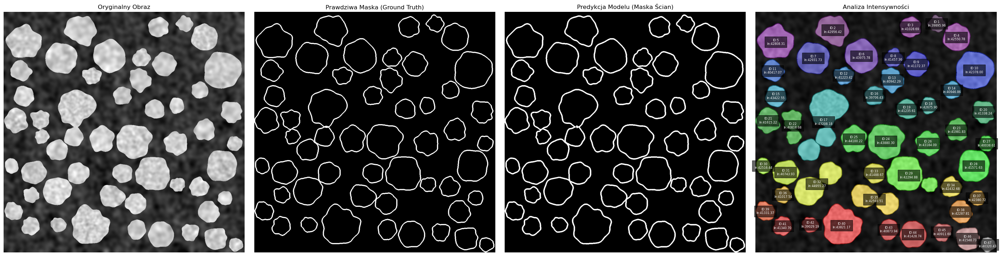


Analiza obrazu: 1.npy
Wykryto 55 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  42677.63                     12922.64           14365
1            2                  41898.59                     13372.96           12426
2            3                  42758.48                     13888.92            7232
3            4                  42488.75                     14259.01            4966
4            5                  40058.66                     12846.90            3425
5            6                  45033.27                     13263.99            7543
6            7                  42098.85                     14780.59            4839
7            8                  41481.47                     14639.05            4249
8            9                  42852.00                     14281.36           21628
9           10                  41098.26                     14759.12            4243
10        

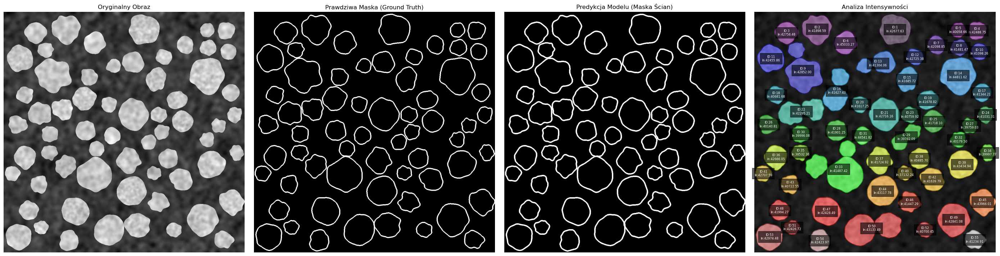


Analiza obrazu: 2.npy
Wykryto 49 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  30663.29                     28595.31            1650
1            2                  41907.40                     13233.82           17523
2            3                  43214.59                     12318.98            8074
3            4                  44079.05                     13909.91            6312
4            5                  41877.21                     13265.36           25321
5            6                  43518.68                     13224.03           18691
6            7                  41729.39                     12350.15            3551
7            8                  43382.72                     13050.67            4503
8            9                  41963.25                     14038.65           11358
9           10                  40817.39                     13800.43            5252
10        

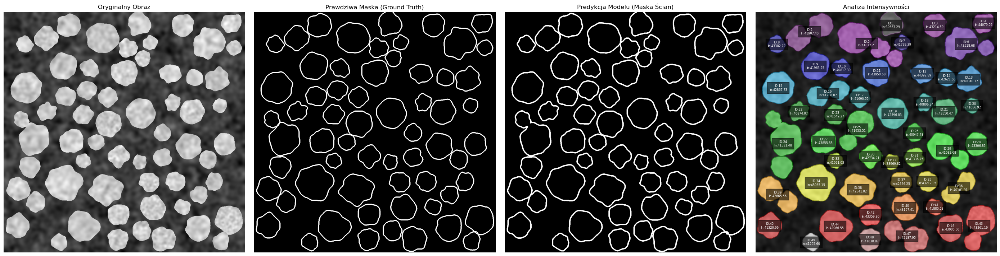


Analiza obrazu: 3.npy
Wykryto 57 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  42021.23                     11442.24            4746
1            2                  43139.07                     11854.58           15351
2            3                  41894.40                     11429.36            5598
3            4                  42282.26                     10357.70            7920
4            5                  41787.44                     12123.05            9081
5            6                  40093.47                     11110.69            4630
6            7                  38595.11                      9699.54            4259
7            8                  40857.16                     10829.23            3779
8            9                  41172.59                     10772.05            5655
9           10                  41478.61                      9915.03            6969
10        

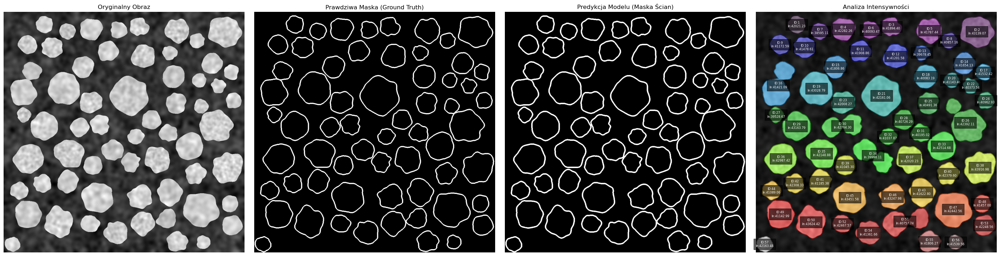


Analiza obrazu: 4.npy
Wykryto 59 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  41250.49                     14514.33            3788
1            2                  43551.70                     13568.80            7092
2            3                  40935.03                     14086.60            5848
3            4                  42393.74                     10805.27            3423
4            5                  42828.57                     13204.85            3838
5            6                  40262.40                     13129.14            4868
6            7                  41018.50                     14941.81            3829
7            8                  42669.81                     12573.89            7707
8            9                  40822.51                     14521.41            4021
9           10                  39776.90                     12621.14            5507
10        

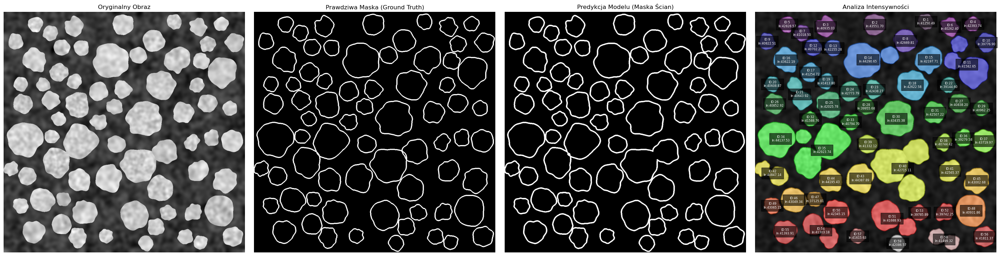


Analiza obrazu: 5.npy
Wykryto 54 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  29543.32                     27589.68            1083
1            2                  42279.50                     14474.63           11509
2            3                  40893.12                     12756.22            3379
3            4                  42874.09                     15477.79            7104
4            5                  42552.08                     13458.59           22188
5            6                  40392.92                     12374.97           10391
6            7                  43586.31                     13892.35           14446
7            8                  41667.25                     12689.21            4805
8            9                  41876.50                     14000.66            4662
9           10                  42455.96                     16583.22            4382
10        

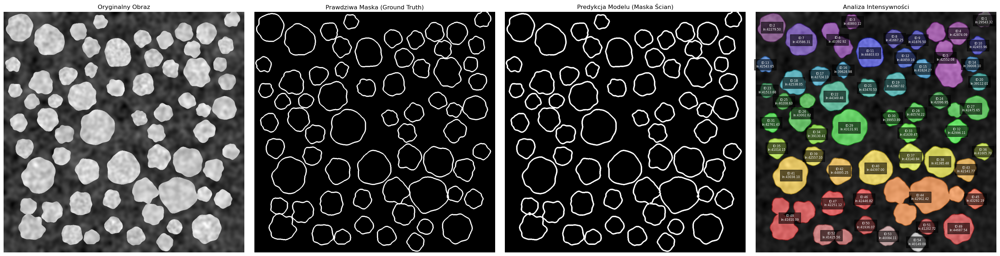


Analiza obrazu: 6.npy
Wykryto 45 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  29906.79                     29195.92            2643
1            2                  41858.10                     14248.30           11009
2            3                  41427.39                     13832.86            5572
3            4                  41702.99                     13067.06            7912
4            5                  42454.84                     13316.22           12962
5            6                  38890.49                     11415.59            3413
6            7                  40639.04                     13270.06            8367
7            8                  41895.79                     13462.34            3587
8            9                  43822.83                     14616.54            9049
9           10                  39529.38                     13763.12            6319
10        

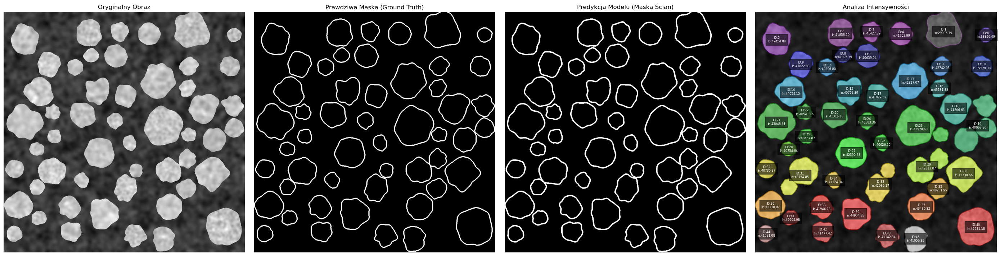


Analiza obrazu: 7.npy
Wykryto 45 obiektów.
    ID obiektu Śr. intensywność wewnątrz Śr. intensywność na zewnątrz  Pole (piksele)
0            1                  30917.50                     29550.53            1322
1            2                  42117.21                     13551.25            3460
2            3                  40552.15                     16337.93            5259
3            4                  40928.06                     14098.18            8709
4            5                  41670.85                     15795.92            4854
5            6                  40779.29                     12899.25           11990
6            7                  41699.52                     14536.82            4328
7            8                  41509.65                     13970.64            4748
8            9                  42868.20                     14445.49           20951
9           10                  42318.44                     15056.57           12199
10        

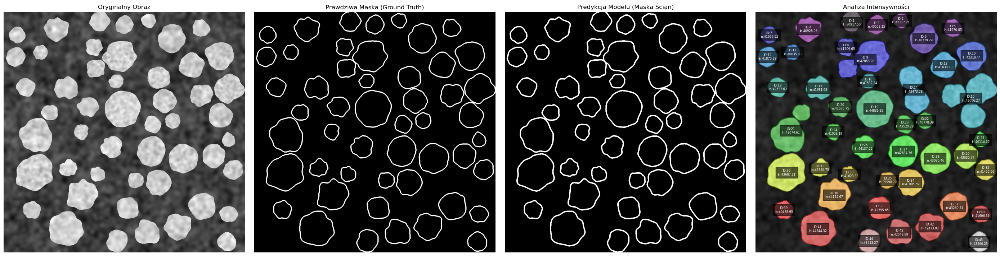

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from skimage.draw import polygon as draw_polygon, polygon_perimeter as draw_perimeter
from skimage.morphology import disk as morph_disk, remove_small_objects, dilation
from scipy.ndimage import label, binary_fill_holes, gaussian_filter
import pandas as pd

def create_test_dataset(num_images, img_size=(1024, 1024), output_dir="data/test"):
    img_path = os.path.join(output_dir, "images")
    mask_path = os.path.join(output_dir, "masks")
    os.makedirs(img_path, exist_ok=True)
    os.makedirs(mask_path, exist_ok=True)
    print(f"Generowanie {num_images} nowych obrazów testowych do folderu {output_dir}...")
    for i in tqdm(range(num_images)):
        base_noise = np.zeros(img_size)
        for sigma in [8, 16, 32, 64]:
            base_noise += gaussian_filter(np.random.rand(*img_size), sigma=sigma)
        image = (base_noise - np.min(base_noise)) / (np.max(base_noise) - np.min(base_noise)) * 0.4
        mask_wall = np.zeros(img_size, dtype=bool)
        num_cells, placed_cells = np.random.randint(50, 80), []
        for _ in range(num_cells):
            for attempt in range(100):
                radius = np.random.randint(30, 80)
                center_x, center_y = np.random.randint(radius, img_size[1] - radius), np.random.randint(radius, img_size[0] - radius)
                is_overlapping = any(np.sqrt((center_x - px)**2 + (center_y - py)**2) < (radius + pr + 5) for px, py, pr in placed_cells)
                if not is_overlapping:
                    placed_cells.append((center_x, center_y, radius))
                    break
            if 'is_overlapping' in locals() and is_overlapping: continue
            angles = np.linspace(0, 2 * np.pi, 100, endpoint=False)
            smooth_noise_rad = gaussian_filter(np.random.randn(100), sigma=3, mode='wrap')
            deformed_radius = radius * (1 + np.random.uniform(0.15, 0.3) * smooth_noise_rad)
            rr, cc = center_y + deformed_radius * np.sin(angles), center_x + deformed_radius * np.cos(angles)
            rr_poly, cc_poly = draw_polygon(rr, cc, shape=img_size)
            internal_texture = gaussian_filter(np.random.rand(*img_size), sigma=np.random.uniform(4, 8))
            internal_texture = (internal_texture - np.min(internal_texture)) / (np.max(internal_texture) - np.min(internal_texture))
            image[rr_poly, cc_poly] = 0.5 + internal_texture[rr_poly, cc_poly] * 0.4
            rr_peri, cc_peri = draw_perimeter(rr.astype(int), cc.astype(int), shape=img_size)
            mask_wall[rr_peri, cc_peri] = True
        mask_wall = binary_dilation(mask_wall, morph_disk(2))
        image_16bit = (np.clip(image, 0, 1) * 65535).astype(np.uint16)
        mask_16bit = (mask_wall.astype(np.uint16) * 65535)
        np.save(os.path.join(img_path, f"{i}.npy"), image_16bit)
        np.save(os.path.join(mask_path, f"{i}.npy"), mask_16bit)
    print("Zbiór testowy wygenerowany.")
    return output_dir

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.double_conv(x)
class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels))
    def forward(self, x): return self.maxpool_conv(x)
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, bias=True), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, bias=True), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, bias=True), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        g1, x1 = self.W_g(g), self.W_x(x)
        psi = self.relu(g1 + x1)
        return x * self.psi(psi)
class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1, x2):
        x1 = self.up(x1)
        return self.conv(torch.cat([x2, x1], dim=1))
class AttentionUNET(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(AttentionUNET, self).__init__()
        self.inc = DoubleConv(n_channels, 16)
        self.down1 = Down(16, 32); self.down2 = Down(32, 64)
        self.down3 = Down(64, 128); self.down4 = Down(128, 256)
        self.att1 = AttentionGate(F_g=128, F_l=128, F_int=64); self.up1 = Up(256, 128)
        self.att2 = AttentionGate(F_g=64, F_l=64, F_int=32); self.up2 = Up(128, 64)
        self.att3 = AttentionGate(F_g=32, F_l=32, F_int=16); self.up3 = Up(64, 32)
        self.att4 = AttentionGate(F_g=16, F_l=16, F_int=8); self.up4 = Up(32, 16)
        self.outc = nn.Conv2d(16, n_classes, kernel_size=1)
    def forward(self, x):
        x1 = self.inc(x); x2 = self.down1(x1); x3 = self.down2(x2); x4 = self.down3(x3); x5 = self.down4(x4)
        g1 = self.up1.up(x5); s1 = self.att1(g=g1, x=x4); d1 = self.up1(x5, s1)
        g2 = self.up2.up(d1); s2 = self.att2(g=g2, x=x3); d2 = self.up2(d1, s2)
        g3 = self.up3.up(d2); s3 = self.att3(g=g3, x=x2); d3 = self.up3(d2, s3)
        g4 = self.up4.up(d3); s4 = self.att4(g=g4, x=x1); d4 = self.up4(d3, s4)
        return self.outc(d4)

def analyze_and_visualize_prediction(model, image_path, mask_path, device):
    model.eval()
    
    image_np = np.load(image_path)
    mask_np = (np.load(mask_path) > 0).astype(np.float32)
    image_tensor = torch.from_numpy(image_np.astype(np.float32) / 65535.0).unsqueeze(0).unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(image_tensor)
        pred_mask_raw = torch.sigmoid(output) > 0.5
    
    pred_mask_np = pred_mask_raw.squeeze().cpu().numpy().astype(np.float32)
    cleaned_mask = remove_small_objects(pred_mask_np > 0.5, min_size=100)
    interior_mask = binary_fill_holes(cleaned_mask)
    labeled_interiors, num_labels = label(interior_mask)
    
    print(f"\nAnaliza obrazu: {os.path.basename(image_path)}")
    print(f"Wykryto {num_labels} obiektów.")
    
    results = []
    for i in range(1, num_labels + 1):
        single_interior_mask = (labeled_interiors == i)
        dilated_mask = dilation(single_interior_mask, morph_disk(10))
        exterior_mask = dilated_mask & ~single_interior_mask
        mean_intensity_interior = np.mean(image_np[single_interior_mask])
        mean_intensity_exterior = np.mean(image_np[exterior_mask])
        area = np.sum(single_interior_mask)
        results.append({
            "ID obiektu": i, "Śr. intensywność wewnątrz": f"{mean_intensity_interior:.2f}",
            "Śr. intensywność na zewnątrz": f"{mean_intensity_exterior:.2f}", "Pole (piksele)": area
        })
    
    results_df = pd.DataFrame(results)
    print(results_df.to_string())

    intersection = np.sum(cleaned_mask.astype(np.float32) * mask_np)
    union = np.sum(cleaned_mask) + np.sum(mask_np)
    dice_score = (2. * intersection) / (union + 1e-8)
    print(f"\nWynik Dice Score dla tego obrazu: {dice_score:.4f}")

    fig, axes = plt.subplots(1, 4, figsize=(28, 7))
    axes[0].imshow(image_np, cmap='gray'); axes[0].set_title("Oryginalny Obraz")
    axes[1].imshow(mask_np, cmap='gray'); axes[1].set_title("Prawdziwa Maska (Ground Truth)")
    axes[2].imshow(cleaned_mask, cmap='gray'); axes[2].set_title("Predykcja Modelu (Maska Ścian)")
    axes[3].imshow(image_np, cmap='gray'); axes[3].set_title("Analiza Intensywności")
    axes[3].imshow(labeled_interiors, cmap='nipy_spectral', alpha=0.5)
    for r in results:
        y, x = np.mean(np.argwhere(labeled_interiors == r["ID obiektu"]), axis=0)
        axes[3].text(x, y, f"ID:{r['ID obiektu']}\nIn:{r['Śr. intensywność wewnątrz']}", 
                     color='white', ha='center', va='center', fontsize=6, bbox=dict(facecolor='black', alpha=0.6))
    for ax in axes: ax.axis('off')
    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    MODEL_PATH = "best_attention_unet.pth"
    NUM_TEST_IMAGES = 8
    TEST_DIR = "data/test"

    create_test_dataset(num_images=NUM_TEST_IMAGES, output_dir=TEST_DIR)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = AttentionUNET(n_channels=1, n_classes=1)
    
    if not os.path.exists(MODEL_PATH):
        print(f"BŁĄD: Nie znaleziono pliku z modelem: {MODEL_PATH}")
    else:
        model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
        model.to(device)

        test_image_dir = os.path.join(TEST_DIR, "images")
        test_mask_dir = os.path.join(TEST_DIR, "masks")
        test_images = sorted(os.listdir(test_image_dir))

        for img_name in test_images:
            image_path = os.path.join(test_image_dir, img_name)
            mask_path = os.path.join(test_mask_dir, img_name)
            analyze_and_visualize_prediction(model, image_path, mask_path, device)

